# Optic disk detection using YOLO

In [1]:
from ultralytics import YOLO
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

In [2]:
def show_optic_disk_shapes(model, image_dir, image_numbers, conf=0.25, cols=5, figsize=(20, 10)):
    """
    Predicts segmentation masks for multiple images and displays
    the exact predicted mask contours (borders) for each image.

    Args:
        model: YOLO segmentation model (e.g., YOLOv8)
        image_dir: directory containing input images
        image_numbers: list of image numbers (e.g., [1, 2, 3])
        conf: confidence threshold for predictions
        cols: number of columns in the subplot grid
        figsize: overall figure size
    """
    image_dir = Path(image_dir)
    rows = int(np.ceil(len(image_numbers) / cols))
    plt.figure(figsize=figsize)

    for i, num in enumerate(image_numbers):
        filename = f"{num:04d}.png"
        img_path = image_dir / filename

        # Run prediction
        results = model.predict(source=str(img_path), conf=conf, verbose=False, show=False, save=False)
        if not results or results[0].masks is None:
            print(f"[Warning] No mask found in {filename}")
            continue

        # Read image
        img = cv2.imread(str(img_path))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        overlay = img.copy()

        # Draw all predicted mask contours
        for mask_xy in results[0].masks.xy:
            contour = mask_xy.astype(np.int32)
            cv2.polylines(overlay, [contour], isClosed=True, color=(0, 255, 0), thickness=2)

        # Blend overlay for nicer visualization
        blended = cv2.addWeighted(img, 0.7, overlay, 0.3, 0)

        # Plot
        plt.subplot(rows, cols, i + 1)
        plt.imshow(blended)
        plt.title(filename)
        plt.axis("off")

    plt.tight_layout()
    plt.show()

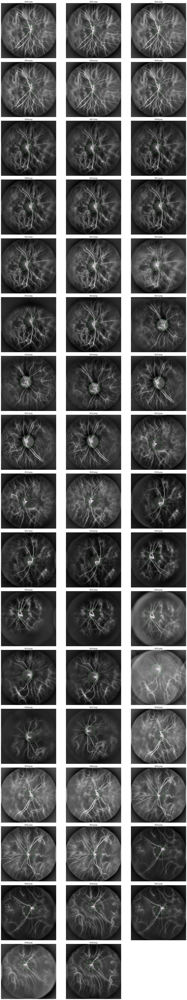

In [4]:
trained_model = YOLO("runs/train/optic_disk_segmentation2/weights/best.pt")
show_optic_disk_shapes(trained_model, "data/optic_disk/train", image_numbers=range(500, 550), cols=3, figsize=(20, 100))